# Telco Customer Churn Prediction

## The Data
The data set used in this project is a collection of customers' personal information and service information. The intended use is to predict if a cusotmer will churn, or leave the company. Below is the list of columns and a description for each.

Customers who left within the last month – the column is called Churn

Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies

Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges

Demographic info about customers – gender, age range, and if they have partners and dependents

CustomerID: Customer ID

Gender: Whether the customer is a male or a female

Senior Citizen: Whether the customer is a senior citizen or not (1, 0)

Partner: Whether the customer has a partner or not (Yes, No)

Dependents: Whether the customer has dependents or not (Yes, No)

Tenure: Number of months the customer has stayed with the company

Phone Service: Whether the customer has a phone service or not (Yes, No)

Multiple Lines: Whether the customer has multiple lines or not (Yes, No, No phone service)

Internet Service: Customer’s internet service provider (DSL, Fiber optic, No)

Online Security: Whether the customer has online security or not (Yes, No, No internet service)

Online Backup: Whether the customer has online backup or not (Yes, No, No internet service)

Device Protection: Whether the customer has device protection or not (Yes, No, No internet service)

Tech Support: Whether the customer has tech support or not (Yes, No, No internet service)

Streaming TV: Whether the customer has streaming TV or not (Yes, No, No internet service)

Streaming Movies: Whether the customer has streaming movies or not (Yes, No, No internet service)

Contract: The contract term of the customer (Month-to-month, One year, Two year)

Paperless Billing: Whether the customer has paperless billing or not (Yes, No)

Payment Method: The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))

Monthly Charges: The amount charged to the customer monthly

Total Charges: The total amount charged to the customer

Churn: Whether the customer churned or not (Yes or No)

Each row represents a customer, each column contains customer’s attributes described on the column Metadata.

The raw data contains 7043 rows (customers) and 21 columns (features).

The “Churn” column is our target.

In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn import datasets, metrics

## Load and explore the data

In [2]:
df = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')

In [3]:
df.shape

(7043, 21)

In [4]:
pd.set_option('display.width', 100)
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)

In [5]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [7]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [8]:
#change total charges to numeric for visualization
df["TotalCharges"] = pd.to_numeric(df['TotalCharges'], errors='coerce')

In [9]:
#drop customer ID 
df.drop(['customerID'], axis=1, inplace=True)

## Visualize the Data

In [10]:
#create list of categorical data
non_numeric_columns = df.select_dtypes(['object']).columns
print(non_numeric_columns)
print("The number of non-numerical columns is {}".format(len(non_numeric_columns)))

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')
The number of non-numerical columns is 16


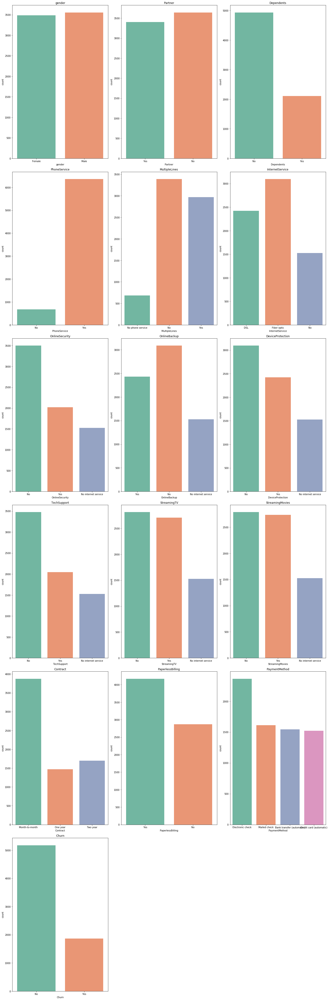

In [11]:
#countplot for each of the categorical columns
variables_to_plot = list(non_numeric_columns)
fig = plt.figure(figsize=(20,60))
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(6,3,i+1)
    ax = sns.countplot(x=var_name, data=df, ax=ax, palette='Set2')
    ax.set_title(var_name)
fig.tight_layout()
plt.show()

In [12]:
#create list of numerical columns
numeric_columns = df.select_dtypes(['float64', 'int64', 'uint8']).columns
print(numeric_columns)
print("The number of numerical columns is {}".format(len(numeric_columns)))

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')
The number of numerical columns is 4


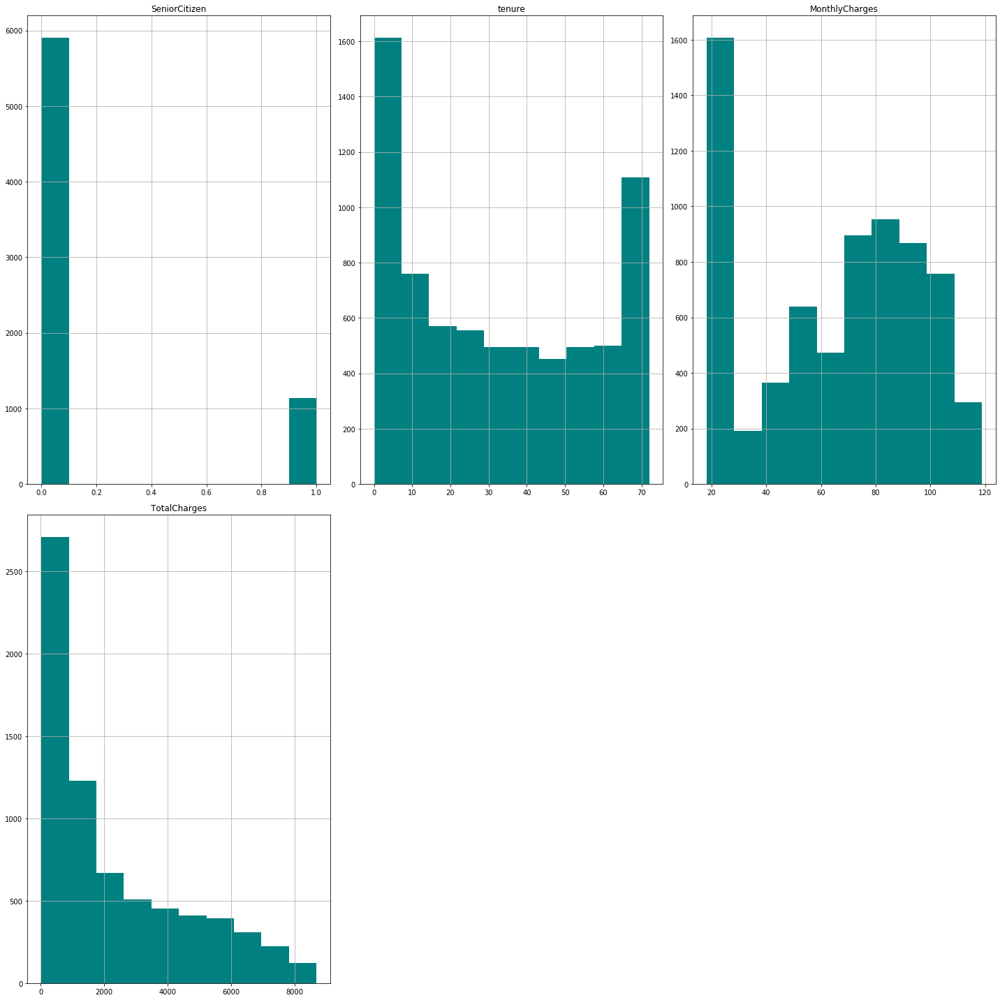

In [13]:
variables_to_plot = list(df[numeric_columns])
fig = plt.figure(figsize=(20,20))
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(2,3,i+1)
    df[var_name].hist(bins=10,ax=ax, color='teal')
    ax.set_title(var_name)
fig.tight_layout()

## Clean the Data

In [14]:
#convert categorical columns using one-hot-encoding
dummy_list = [non_numeric_columns]
for col in dummy_list:
    df = pd.concat([df,pd.get_dummies(df[col], prefix=col, drop_first=True)], axis=1)
    dummy_column_names = list(pd.get_dummies(df[col], prefix=col, drop_first=True).columns)

In [15]:
#check column types
df.dtypes

gender                                    object
SeniorCitizen                              int64
Partner                                   object
Dependents                                object
tenure                                     int64
PhoneService                              object
MultipleLines                             object
InternetService                           object
OnlineSecurity                            object
OnlineBackup                              object
DeviceProtection                          object
TechSupport                               object
StreamingTV                               object
StreamingMovies                           object
Contract                                  object
PaperlessBilling                          object
PaymentMethod                             object
MonthlyCharges                           float64
TotalCharges                             float64
Churn                                     object
gender_Male         

In [16]:
#check for missing values
df.isnull().sum()

gender                                    0
SeniorCitizen                             0
Partner                                   0
Dependents                                0
tenure                                    0
PhoneService                              0
MultipleLines                             0
InternetService                           0
OnlineSecurity                            0
OnlineBackup                              0
DeviceProtection                          0
TechSupport                               0
StreamingTV                               0
StreamingMovies                           0
Contract                                  0
PaperlessBilling                          0
PaymentMethod                             0
MonthlyCharges                            0
TotalCharges                             11
Churn                                     0
gender_Male                               0
Partner_Yes                               0
Dependents_Yes                  

In [17]:
#fill in missing values
df['TotalCharges'].fillna(df['TotalCharges'].mean(), inplace=True)

In [18]:
#create a list of numeric columns
numeric_columns = df.select_dtypes(['float64', 'int64', 'uint8']).columns
print(numeric_columns)
print("The number of numerical columns is {}".format(len(numeric_columns)))

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges', 'gender_Male', 'Partner_Yes',
       'Dependents_Yes', 'PhoneService_Yes', 'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No internet service',
       'OnlineSecurity_Yes', 'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No internet service',
       'StreamingTV_Yes', 'StreamingMovies_No internet service', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year', 'PaperlessBilling_Yes',
       'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check',
       'PaymentMethod_Mailed check', 'Churn_Yes'],
      dtype='object')
The number of numerical columns is 31


## Model Preparation

In [19]:
#define the updated dataframe 
new_df = df[numeric_columns]

In [20]:
#Define the variables
X = new_df.drop('Churn_Yes', axis=1)
y = df['Churn_Yes']
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

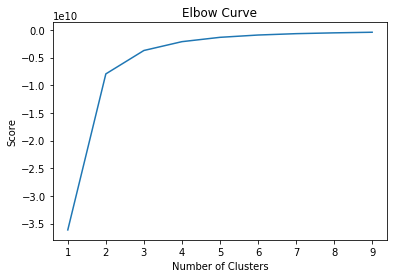

In [21]:
#Elbow Plot
clustno = range(1, 10)

kmeans = [KMeans(n_clusters=i) for i in clustno]

score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]

plt.plot(clustno, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

It appears from the elbow plot that between 2 and 5 clusters will yield the best results. I will further investigate this by splitting the data and visualizing the consitency for each number of clusters.

In [22]:
#Odd number of rows, in order to split the rows in half, temporarily drop the last row.
X1 = X[:-1]
y = df['Churn_Yes']
scaler = StandardScaler()
X1_std = scaler.fit_transform(X1)

In [23]:
#Spliting the data to compare consistancy across a different numbers of clusters
pca = PCA(n_components=2)
X1_pca = pca.fit_transform(X1_std)


X1_half1, X1_half2, X1_pcahalf1, X1_pcahalf2 = train_test_split(
    X1_std,
    X1_pca,
    test_size=0.5,
    random_state=13579)

In [24]:
ypred = pd.DataFrame()

for counter, data in enumerate([(X1_half1, X1_pcahalf1), (X1_half2, X1_pcahalf2)]):
    # Put the features into ypred.
    ypred['pca_f1' + '_sample' + str(counter)] = data[1][:, 0]
    ypred['pca_f2' + '_sample' + str(counter)] = data[1][:, 1]
    
    # Generate cluster predictions and store them for clusters 2 to 4.
    for nclust in range(2, 6):
        pred = KMeans(n_clusters=nclust, random_state=123).fit_predict(data[counter])
        ypred['clust' + str(nclust) + '_sample' + str(counter)] = pred

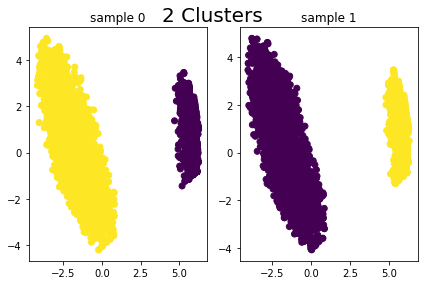

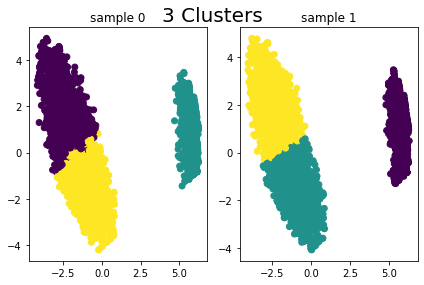

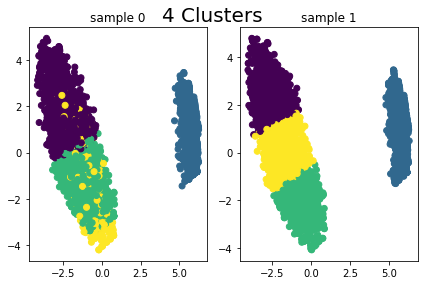

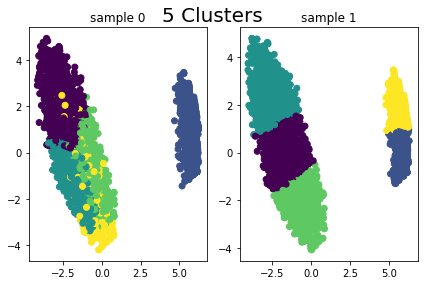

In [25]:
# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(2, 6):
    
    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('{} Clusters'.format(cluster), fontsize=20)
    plt.tight_layout()
    plt.show()
    print('\n')

Based on the visualizations above, it looks like 2, 3 and 4 clusters are consistent across the data, while 5 clusters shifts the distribution between the separated groups. Since customer churn has only 2 possibilites, churn or not churn, 2 clusters would be the ideal way the data would split. I will first examine the data using 2 clusters, then I will continue to explore the data using 3 and 4 clusters. 

# Model Selection Phase

## K-means
Two Clusters

In [26]:
#defining the KMeans model
kmeans_cluster2 = KMeans(n_clusters=2, random_state=123)

#Fit model
y_pred_km2 = kmeans_cluster2.fit_predict(X_std)

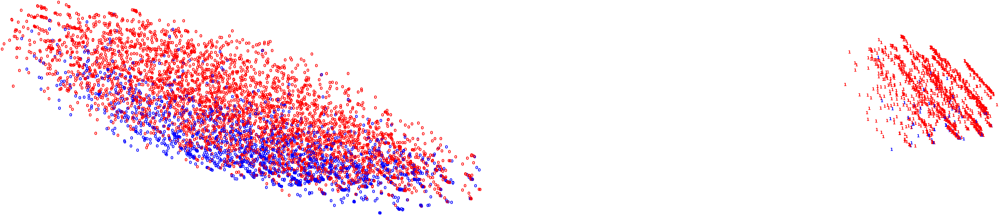

In [27]:
#Plotting the predictions and the actual values. The color depicts the the actual y value and the number depicts
#the prediction
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(20,5))
colours = 'rb'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_km2[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [28]:
pd.crosstab(y, y_pred_km2)

col_0,0,1
Churn_Yes,,
0,3761,1413
1,1756,113


In [29]:
print("Adjusted Rand Index of the K-means Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, y_pred_km2)))

Adjusted Rand Index of the K-means Clustering solution: -0.06539325963610504


## Hierarchical Clustering
Two Clusters

In [30]:
# Defining the agglomerative clustering
agg_cluster2 = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=2)

# Fit model
y_pred_agg2 = agg_cluster2.fit_predict(X_std)

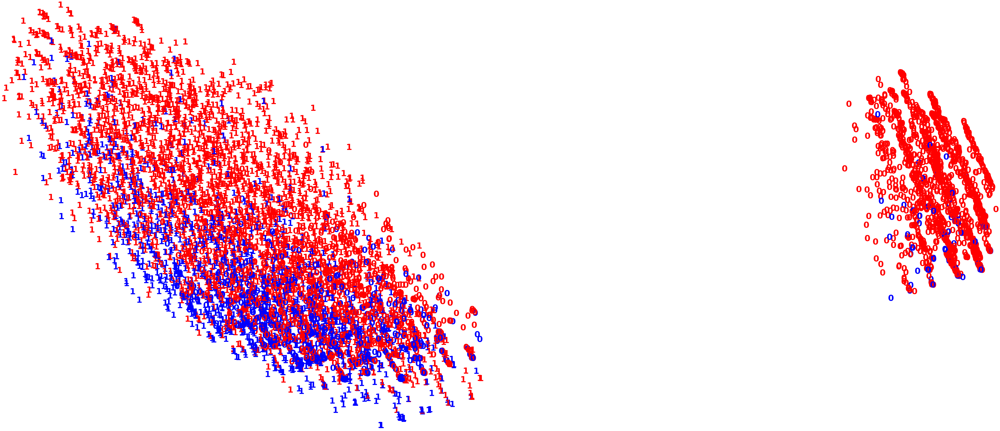

In [31]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_agg2[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [32]:
pd.crosstab(y, y_pred_agg2)

col_0,0,1
Churn_Yes,,
0,2172,3002
1,693,1176


In [33]:
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, y_pred_agg2)))

Adjusted Rand Index of the Agglomerative Clustering solution: -0.005374353848939782


## Gaussian Mixture
Two Clusters

In [34]:
from sklearn.mixture import GaussianMixture
# Defining the agglomerative clustering
gmm_cluster2 = GaussianMixture(n_components=2, random_state=123)

# Fit model
y_pred_gmm2 = gmm_cluster2.fit_predict(X_std)

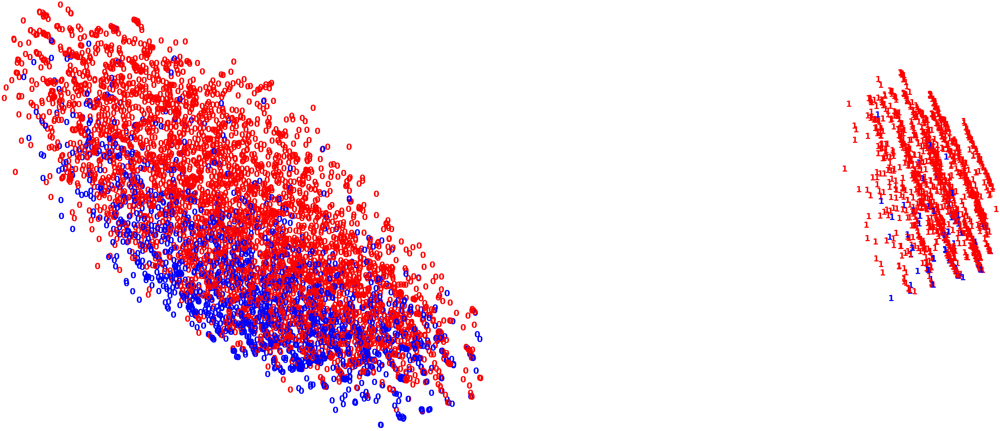

In [35]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_gmm2[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [36]:
pd.crosstab(y, y_pred_gmm2)

col_0,0,1
Churn_Yes,,
0,3761,1413
1,1756,113


In [37]:
print("Adjusted Rand Index of the Gaussian Mixture Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, y_pred_gmm2)))

Adjusted Rand Index of the Gaussian Mixture Clustering solution: -0.06539325963610504


Two Cluster Analysis:

Since the ground truth is known, I created a contingency table to show the number of correctly labeled points and mislabeled points. Using the ARI, I calculated the accuracy of each clustering technique. While it is clear on the contigency table that a large portion of points were incorrectly predicted, the ARI confirms it. The ARI for both K-means and Gaussian Mixture are both approximately -0.0654, while the agglomeritve model has a score of approximately -0.0054, a slight improvement. With a score of 1 being a perfect replication of the ground truth, clearly the first attempt at clustering based on customer churn did not produce desired results. 

# Three Clusters

After trying three clustering methods, visually, there are two distinct clusters. However, these clusters are not separating customer churn. Since blue indicates churn and red indicates no churn, we can see that none of the algorithms have split them into these two groups. Next, I will use the same algorithms using 3 and 4 clusters. Since our target variable only has two values, 0 and 1, I will be changing the points on the plot to match the color with the prediction to get a better visual of how the clusters are formed. 

## K-means
Three Clusters

In [38]:
kmeans_cluster3 = KMeans(n_clusters=3, random_state=123)

y_pred_km3 = kmeans_cluster3.fit_predict(X_std)

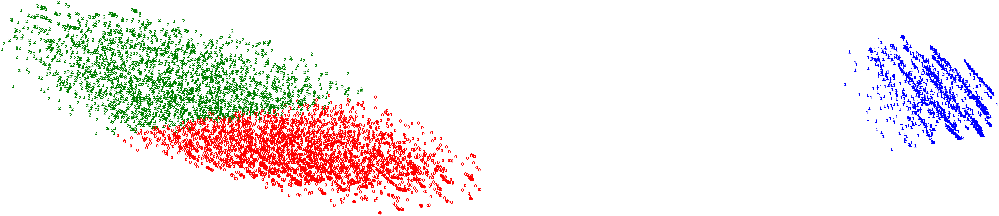

In [39]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(20,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_km3[i]),
             color=colours[int(y_pred_km3[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Hierarchical Clustering
Three Clusters

In [40]:
# Defining the agglomerative clustering
agg_cluster3 = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=3)

# Fit model
y_pred_agg3 = agg_cluster3.fit_predict(X_std)

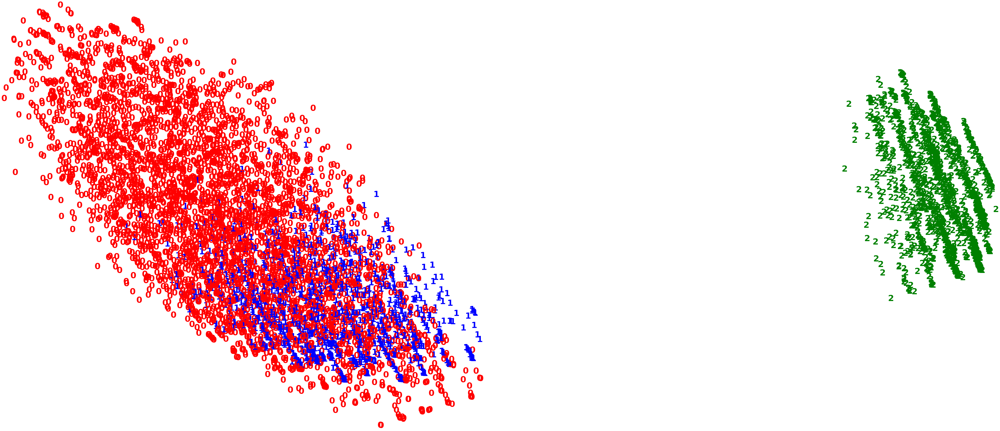

In [41]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_agg3[i]),
             color=colours[y_pred_agg3[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Gaussian Mixture
Three Clusters

In [42]:
from sklearn.mixture import GaussianMixture
# Defining the agglomerative clustering
gmm_cluster3 = GaussianMixture(n_components=3, random_state=123)

# Fit model
y_pred_gmm3 = gmm_cluster3.fit_predict(X_std)

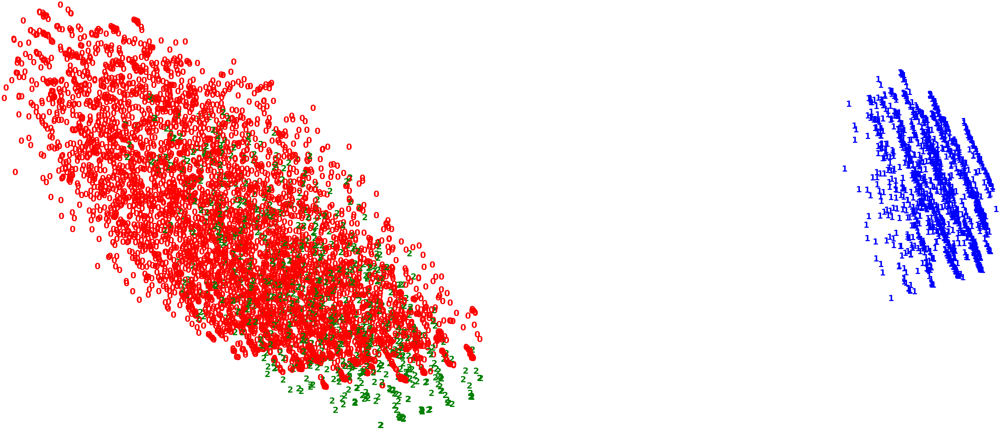

In [43]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_gmm3[i]),
             color=colours[int(y_pred_gmm3[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The K-means model seems to be the only one that shows 3 distinct groupings. While 2 look to be in one cluster, there is very little overlap unlike the hierarchical and Gaussian models. After the next group of clustering, I will examine the silhouette scores of each model to compare. 

# Four Clusters

## K means
Four clusters

In [44]:
kmeans_cluster4 = KMeans(n_clusters=4, random_state=123)

y_pred_km4 = kmeans_cluster4.fit_predict(X_std)

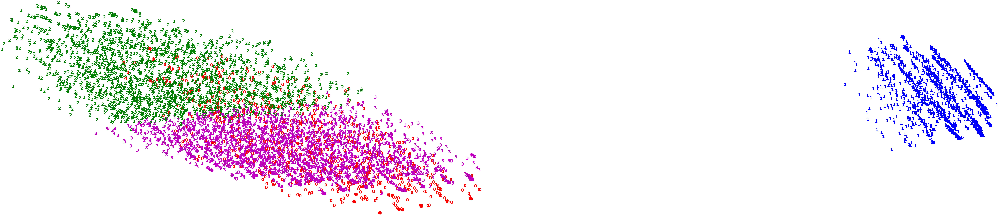

In [45]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(20,5))
colours = 'rbgm'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_km4[i]),
             color=colours[int(y_pred_km4[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Hierarchical Clustering
Four Clusters

In [46]:
# Defining the agglomerative clustering
agg_cluster4 = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
y_pred_agg4 = agg_cluster4.fit_predict(X_std)

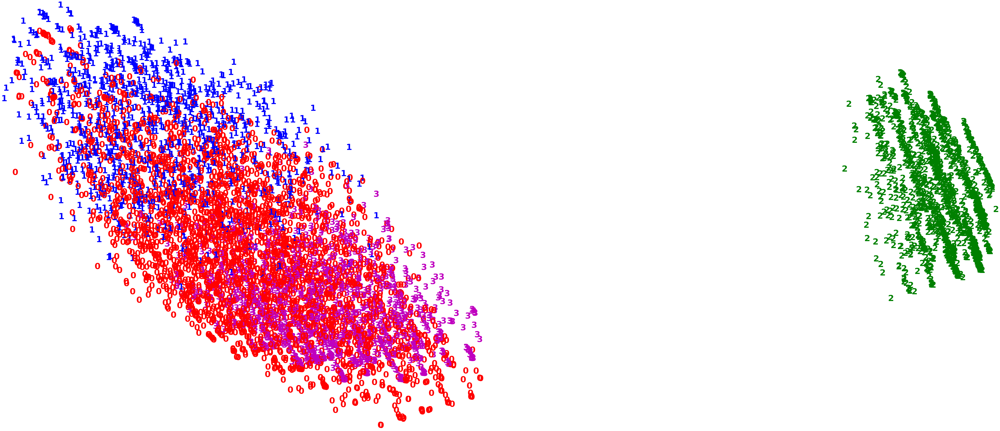

In [47]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbgm'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_agg4[i]),
             color=colours[y_pred_agg4[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Gaussian Mixture

Four Clusters

In [48]:
from sklearn.mixture import GaussianMixture
# Defining the agglomerative clustering
gmm_cluster4 = GaussianMixture(n_components=4, random_state=123)

# Fit model
y_pred_gmm4 = gmm_cluster4.fit_predict(X_std)

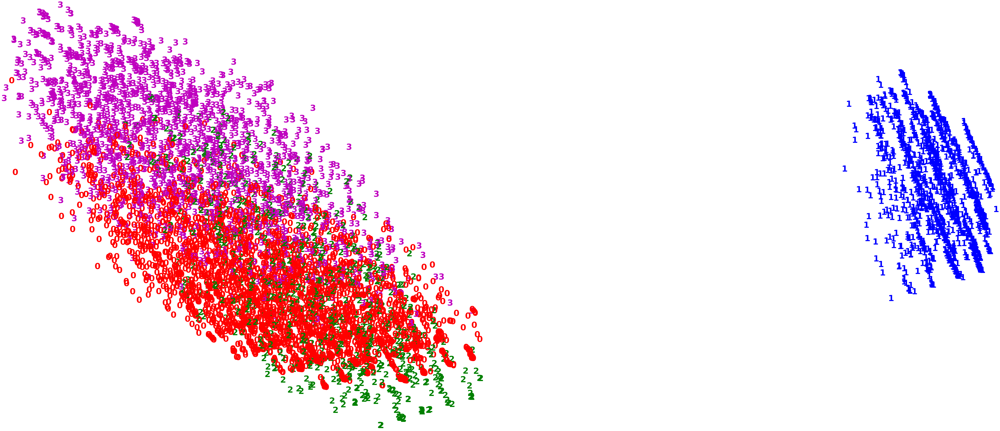

In [49]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbgm'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_gmm4[i]),
             color=colours[int(y_pred_gmm4[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

I am not surprised by the results of each model using 4 clusters. The distribution on the clusters looks similar to sample 0 in the plot where the consitency of the data was examined. In order to accurately evaluate the performance of each model at each number of clusters, I will calculate the silhouette score for each.

In [50]:
print("The silhoutte score of the 2 cluster K-means Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_km2, metric='euclidean')))
print("The silhoutte score of the 2 cluster Hierarchical Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_agg2, metric='euclidean')))
print("The silhoutte score of the 2 cluster Gaussian Mixture Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_gmm2, metric='euclidean')))
print('--------------------------------------------------------------------------')

print("The silhoutte score of the 3 cluster K-means Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_km3, metric='euclidean')))
print("The silhoutte score of the 3 cluster hierarchical solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_agg3, metric='euclidean')))
print("The silhoutte score of the 3 cluster Gaussian Mixture solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_gmm3, metric='euclidean')))
print('---------------------------------------------------------------------------')

print("The silhoutte score of the 4 cluster K-means Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_km4, metric='euclidean')))
print("The silhoutte score of the 4 cluster Hierarchical Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_agg4, metric='euclidean')))
print("The silhoutte score of the 4 cluster Gaussian Mixture Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred_gmm4, metric='euclidean')))

The silhoutte score of the 2 cluster K-means Clustering solution: 0.3349331360987445
The silhoutte score of the 2 cluster Hierarchical Clustering solution: 0.15767817068843204
The silhoutte score of the 2 cluster Gaussian Mixture Clustering solution: 0.3349331360987445
--------------------------------------------------------------------------
The silhoutte score of the 3 cluster K-means Clustering solution: 0.21932492495878664
The silhoutte score of the 3 cluster hierarchical solution: 0.12185962572777512
The silhoutte score of the 3 cluster Gaussian Mixture solution: 0.2885122664113922
---------------------------------------------------------------------------
The silhoutte score of the 4 cluster K-means Clustering solution: 0.2390569250036038
The silhoutte score of the 4 cluster Hierarchical Clustering solution: 0.12091538092668534
The silhoutte score of the 4 cluster Gaussian Mixture Clustering solution: 0.23009387731093495


Comparing the silhoutte scores, K-means and Gaussian Mixture produced the best results with approximately 0.335. While the score in and of itself is not great, it is the closest to one when compared to the others. It is also clear that the data splits into 2 distinct clusters when plotted using PCA. My next step is to tune one of the models to try to improve the score. Since both models I mentioned have the same score, I chose to tune the Gaussian Mixutre model because K-means assumes isotropicly distributed clusters and Gaussian Mixture does not. Since the larger cluster on the left is an elongated cluster, Gaussian Mixture would be a better fit. 

## Tuning Gaussian Mixture

In [51]:
# Defining the agglomerative clustering
gmm_cluster_tied = GaussianMixture(n_components=2, random_state=123, covariance_type="tied")

# Fit model
y_pred_tied = gmm_cluster_tied.fit_predict(X_std)

print("ARI score with covariance_type=tied: {}".format(
    metrics.adjusted_rand_score(y, y_pred_tied)))

print("Silhouette score with covariance_type=tied: {}".format(
    metrics.silhouette_score(X_std, y_pred_tied, metric='euclidean')))
print("------------------------------------------------------")

# Defining the agglomerative clustering
gmm_cluster_diag = GaussianMixture(n_components=2, random_state=123, covariance_type="diag")

# Fit model
y_pred_diag = gmm_cluster_diag.fit_predict(X_std)

print("ARI score with covariance_type=diag: {}".format(
    metrics.adjusted_rand_score(y, y_pred_diag)))

print("Silhouette score with covariance_type=diag: {}".format(
    metrics.silhouette_score(X_std, y_pred_diag, metric='euclidean')))
print("------------------------------------------------------")


# Defining the agglomerative clustering
gmm_cluster_spher = GaussianMixture(n_components=2, random_state=123, covariance_type="spherical")

# Fit model
y_pred_spher = gmm_cluster_spher.fit_predict(X_std)

print("ARI score with covariance_type=spherical: {}".format(
    metrics.adjusted_rand_score(y, y_pred_spher)))

print("Silhouette score with covariance_type=spherical: {}".format(
    metrics.silhouette_score(X_std, y_pred_spher, metric='euclidean')))
print("------------------------------------------------------")

ARI score with covariance_type=tied: -0.06539325963610504
Silhouette score with covariance_type=tied: 0.3349331360987445
------------------------------------------------------
ARI score with covariance_type=diag: -0.06539325963610504
Silhouette score with covariance_type=diag: 0.3349331360987445
------------------------------------------------------
ARI score with covariance_type=spherical: -0.06539325963610504
Silhouette score with covariance_type=spherical: 0.3349331360987445
------------------------------------------------------


## Results and Next Steps

After tuning the Gaussian model, I continued to get an ARI of -0.065 and a silhouette score of 0.335. Based on those values and the graph of the results, it's pretty clear that the given data does not do a sufficient job of clustering customers to predict churn. However, the graphs from all 3 models show two clearly defined clusters. My next steps would be to dig deeper into the clusters that are produced by these models. I would add a column of the predicted values to the original dataset. From there, I could group the data based on the predictions to examine any underlying similarities. It could even be possible to get information about churn within those two inital clusters. 